In [1]:
import glob
import io
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from skimage import io as sk_io
from pathlib import Path
from typing import Any, Union, Optional  # Meta
from typing import Iterable, Sequence, Mapping, MutableMapping  # Generic ABCs
from typing import Tuple, List  # Generic

from PIL import Image
import re
import logging
from anndata import AnnData
import cv2
import duallog
import scanpy as sc
import scanpy.external as sce
from shapely.geometry import MultiPoint, Point, Polygon,LineString, MultiPolygon
from matplotlib.pyplot import rc_context
import seaborn as sns
import matplotlib.patches as mpatches

In [2]:
from scipy.sparse import spmatrix, issparse
Index1D = Union[slice, int, str, np.int64, np.ndarray]
Index = Union[Index1D, Tuple[Index1D, Index1D], spmatrix]

In [3]:
demo_df = pd.read_csv('/Volumes/BiomedML/Projects/QuPath_projects/Covid19/0419_Detection_100c/Blue/Covid19_channel_measurement_values_x4483_y5795_w186_h175.tsv', sep='\t')
demo_df

,Image,Centroid X px,Centroid Y px,Nucleus: Area,Nucleus: Red mean,Nucleus: Blue mean,Cell: Red mean,Cell: Blue mean
0,0416_tissue_hires_4.tif,4509.3,5797.9,55,18.9310,231.6897,18.9310,231.6897
1,0416_tissue_hires_4.tif,4551.2,5804.5,142,7.1027,208.2397,7.1027,208.2397
2,0416_tissue_hires_4.tif,4574.6,5799.3,78,11.1852,234.5432,11.1852,234.5432
3,0416_tissue_hires_4.tif,4584.7,5796.7,17,47.8000,247.9000,47.8000,247.9000
4,0416_tissue_hires_4.tif,4593.8,5801.9,124,5.9141,227.4062,5.9141,227.4062
...,...,...,...,...,...,...,...,...
84,0416_tissue_hires_4.tif,4650.5,5958.2,134,6.0942,223.0725,6.0942,223.0725
85,0416_tissue_hires_4.tif,4608.7,5958.9,67,9.5735,225.8382,9.5735,225.8382
86,0416_tissue_hires_4.tif,4552.9,5963.0,105,8.5514,233.6262,8.5514,233.6262
87,0416_tissue_hires_4.tif,4567.8,5966.7,74,11.9487,236.8718,11.9487,236.8718


In [4]:
# demo_df2 = pd.read_csv('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt', sep='\t')
# demo_df2

In [5]:
demo_df2.columns[0:15]

Index(['Image', 'Name', 'Class', 'Parent', 'ROI', 'Centroid X µm',
       'Centroid Y µm', 'Nucleus: Area', 'Nucleus: Perimeter',
       'Nucleus: Circularity', 'Nucleus: Max caliper', 'Nucleus: Min caliper',
       'Nucleus: Eccentricity', 'Nucleus: DAPI (DAPI) mean',
       'Nucleus: DAPI (DAPI) sum'],
      dtype='object')

In [6]:
demo_df2.shape

(76375, 132)

In [7]:
list_markers = {}
marker_expression = list()
for col in demo_df2.columns:
    if re.match(r'^Cell(.*)mean$', col): 
        print(re.findall(r'^Cell:\s(.*)\smean$', col))
        list_markers[col] =  re.findall(r'^Cell:\s(.*)\smean$', col)[0]
        marker_expression.append(col)
list_markers

['DAPI (DAPI)']
['CD8 (Opal 480)']
['PD-L1 (Opal 520)']
['FoxP3 (Opal 570)']
['PD-1 (Opal 620)']
['PanCK (Opal 690)']
['CD68 (Opal 780)']
['AF (Autofluorescence)']


{'Cell: DAPI (DAPI) mean': 'DAPI (DAPI)',
 'Cell: CD8 (Opal 480) mean': 'CD8 (Opal 480)',
 'Cell: PD-L1 (Opal 520) mean': 'PD-L1 (Opal 520)',
 'Cell: FoxP3 (Opal 570) mean': 'FoxP3 (Opal 570)',
 'Cell: PD-1 (Opal 620) mean': 'PD-1 (Opal 620)',
 'Cell: PanCK (Opal 690) mean': 'PanCK (Opal 690)',
 'Cell: CD68 (Opal 780) mean': 'CD68 (Opal 780)',
 'Cell: AF (Autofluorescence) mean': 'AF (Autofluorescence)'}

In [8]:
list(list_markers.values())

['DAPI (DAPI)',
 'CD8 (Opal 480)',
 'PD-L1 (Opal 520)',
 'FoxP3 (Opal 570)',
 'PD-1 (Opal 620)',
 'PanCK (Opal 690)',
 'CD68 (Opal 780)',
 'AF (Autofluorescence)']

In [9]:
demo_df2 = demo_df2.rename(columns=list_markers)

In [10]:
type(demo_df2[list_markers.values()])

pandas.core.frame.DataFrame

In [11]:
# regex_marker_rule = r''

regex_marker_rule = r''.join(['(?!{0})'.format(value.split(' ')[0]) for value in list(list_markers.values())])
    
print(regex_marker_rule)

(?!DAPI)(?!CD8)(?!PD-L1)(?!FoxP3)(?!PD-1)(?!PanCK)(?!CD68)(?!AF)


In [492]:
r'^Nucleus:\s+{0}(.*)'.format(regex_marker_rule)

'^Nucleus:\\s+(?!DAPI)(?!CD8)(?!PD-L1)(?!FoxP3)(?!PD-1)(?!PanCK)(?!CD68)(?!AF)(.*)'

In [9]:
r'^Cytoplasm:\s+{0}(.*)'.format(regex_marker_rule)

'^Cytoplasm:\\s+(?!DAPI)(?!CD8)(?!PD-L1)(?!FoxP3)(?!PD-1)(?!PanCK)(?!CD68)(?!AF)(.*)'

In [499]:
geo_cols = list()
for col in demo_df2.columns:
    if re.match(r'^Centroid\s+(.*)', col) or re.match(r'^Nucleus:\s+{0}(.*)'.format(regex_marker_rule), col): 
        print( col)
        geo_cols.append(col)
        

Centroid X µm
Centroid Y µm
Nucleus: Area
Nucleus: Perimeter
Nucleus: Circularity
Nucleus: Max caliper
Nucleus: Min caliper
Nucleus: Eccentricity


In [551]:
re.sub('^[X|Y]+\s', '' ,re.findall(r'^Centroid\s+(.*)', 'Centroid X µm')[0])

'µm'

In [500]:
demo_df2[geo_cols]

,Centroid X µm,Centroid Y µm,Nucleus: Area,Nucleus: Perimeter,Nucleus: Circularity,Nucleus: Max caliper,Nucleus: Min caliper,Nucleus: Eccentricity
0,4003.2,2052.6,21.25,18.8005,0.7555,6.9441,4.5403,0.6124
1,3995.0,2059.1,33.75,24.5578,0.7032,9.9091,4.7630,0.8849
2,4992.6,1220.1,87.25,46.6352,0.5041,14.1662,10.2826,0.6180
3,5013.2,1225.6,17.50,15.9834,0.8608,5.4502,4.5281,0.5082
4,4984.2,1230.5,40.75,27.4565,0.6793,9.8380,6.1226,0.8496
...,...,...,...,...,...,...,...,...
76370,2784.2,14984.1,35.00,24.8573,0.7118,9.5342,5.5340,0.8442
76371,2743.6,14986.1,35.25,23.4012,0.8089,8.9932,4.9933,0.8556
76372,2757.8,14996.4,41.75,24.4203,0.8798,8.7817,6.5637,0.7141
76373,2769.8,15006.6,51.00,29.9855,0.7128,12.0115,6.1985,0.8696


In [495]:
demo_df2[marker_expression]

,Cell: DAPI (DAPI) mean,Cell: CD8 (Opal 480) mean,Cell: PD-L1 (Opal 520) mean,Cell: FoxP3 (Opal 570) mean,Cell: PD-1 (Opal 620) mean,Cell: PanCK (Opal 690) mean,Cell: CD68 (Opal 780) mean,Cell: AF (Autofluorescence) mean
0,0.9192,0.1996,0.0001,0.0190,0.0542,3.5905,0.0016,3.6429
1,1.0353,0.2147,0.0001,0.0324,0.0670,3.8246,0.0096,3.2364
2,2.6826,2.0558,0.0000,0.0655,0.1895,5.3563,0.0679,6.1606
3,2.5623,1.7151,0.0000,0.0937,0.1818,4.9910,0.0097,6.0964
4,2.6404,1.7252,0.0001,0.0671,0.1911,5.9082,0.0503,5.7015
...,...,...,...,...,...,...,...,...
76370,4.9581,0.2867,0.0000,0.0034,0.0870,2.1358,0.0085,3.2288
76371,7.9706,0.6169,0.0000,0.0048,0.0454,0.7566,0.0112,3.0351
76372,11.0024,0.4384,0.0000,0.0061,0.0600,1.2708,0.0077,2.9729
76373,8.3003,0.6171,0.0000,0.0028,0.0878,1.8742,0.0084,3.4747


In [13]:
demo_df2.index.values

array([    0,     1,     2, ..., 76372, 76373, 76374])

In [14]:
demo_df2[marker_expression].shape

(76375, 8)

In [1952]:
np.array([1,4,5,7])*3

array([ 3, 12, 15, 21])

In [15]:
# print(Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt').is_file())
# print(Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt').suffix)
# print(Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt').name)
# file_sf = Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt').suffix
# file_name = Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt').name
# print(re.sub(file_sf, '',file_name))
# print(Path('./README.md').parent.resolve())
# print(Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_cell_detection.tsv.txt').parent.resolve())
# parent_path = Path('./README.md').parent.resolve()
# print(parent_path)
# print([x.resolve() for x in parent_path.glob('*') if x.suffix in ['.npy', '.py'] ])

In [133]:
def convert_micron2pixel(x_micron, micron_dim, scale_dim):
    """ convert the annotation box coordinate from micron unit to pixel unit
    
    ox_px_coord = convert_micron2pixel(ox_coords, 6276.93, im_demo.shape[1])
    oy_px_coord = convert_micron2pixel(oy_coords, 15235.53, im_demo.shape[0])
    """
    return (x_micron*scale_dim/micron_dim)

def add_detection_boxes(list_annots, current_ox, current_oy, 
                        current_width, current_height, 
                        sub_h_size=0.5, sub_w_size=0.5,):
    numb_w_subbox = int(1/sub_w_size)
    numb_h_subbox = int(1/sub_h_size)
    sub_annot_width, sub_annot_height = int(current_width * sub_w_size), int(current_height * sub_h_size)
#         list_annots = list()
    for idx_w in range(numb_w_subbox):
        for idx_h in range(numb_h_subbox):
            stride_x = idx_w * sub_annot_width
            stride_y = idx_h * sub_annot_height
            tmp_rect = [stride_x+current_ox, 
                        stride_y+current_oy, 
                        stride_x+current_ox+sub_annot_width, 
                        stride_y+current_oy+sub_annot_height]
            list_annots.append(tmp_rect)

def map_heat_values2colors(values):
    from collections import OrderedDict
    colors = list()
    sorted_values = np.sort(values, kind='mergesort')
    set_box_scores = list(OrderedDict.fromkeys(sorted_values).keys())
    heat_colors_range = sns.color_palette('viridis', len(set_box_scores))
    for value in values:
        raw_color = heat_colors_range[set_box_scores.index(value)]
        colors.append(raw_color)
    return np.array(colors)
    
def list_to_int(list1D):
    """ convert list of float values to integer values """
    return [int(float(x)) for x in list1D]

def draw_rectangles(img, rects, color=(0, 255, 255), thickness=7):
    """ draw rectangles to a cv2 img 
    img: cv2 image in 2D/3D array
    rects: list of rectangle coordinates top, left, bottom, right
    color: rectangle color
    thickness: the thickness of 4 edges
    """
#     print(img.shape)
    clone_image = img.copy()
    for rect in rects:
        pt1 = tuple(list_to_int(rect[0:2]))
        pt2 = tuple(list_to_int(rect[2:]))
#         print(pt1, pt2)
        cv2.rectangle(clone_image, pt1, pt2, color, thickness, cv2.FILLED)
    return clone_image

def draw_rectangles_heat(img, rects:dict, colors:list, thickness=0):
    """Plot the spatial heatmap of cell colocalization score"""
    clone_image = img.copy()
    for index, rect in enumerate(rects):
        pt1 = np.array(list_to_int(rect[0:2]))
        pt2 = np.array(list_to_int(rect[2:]))
        cv2.rectangle(clone_image, tuple(pt1-thickness), tuple(pt2+thickness), colors[index], cv2.FILLED)
    return clone_image


class STRISH_Obj(AnnData):
    
    def __init__(
        self, 
        cnt_matrix: pd.DataFrame, 
        meta_vars: pd.DataFrame, 
        ref_image: Optional[np.ndarray],
        polygon: Optional[Union[pd.DataFrame, Mapping[str, Sequence[Polygon]]]]=None,
        is_view: bool=False
    ):
        super().__init__(cnt_matrix, asview=is_view)
        self.obs = meta_vars
        self._polygon = polygon
        self._ref_image = ref_image
        for col in meta_vars.columns: 
            if re.match(r'^Centroid\s+(.*)', col):
                if 'X' in col:
                    self.__centroid_X = col
                if 'Y' in col:
                    self.__centroid_Y = col
                self._original_coord_unit = re.sub('^[X|Y]+\s', '' ,re.findall(r'^Centroid\s+(.*)', col)[0])
        self._ref_image_unit = 'px'

    def _gen_repr(self, n_obs, n_vars) -> str:
        if self.isbacked:
            backed_at = f" backed at {str(self.filename)!r}"
        else:
            backed_at = ""
        descr = f"STRISH object with n_obs × n_vars = {n_obs} × {n_vars}{backed_at}"
        for attribute in [
            "obs",
            "var",
            "uns",
            "obsm",
            "varm",
            "layers", 'colocalized_scores' , 'colocalized_boxes',
            "obsp", 'all_rects', 'areas', 'contours',
            "varp",'ref_image','original_coord_unit','ref_image_unit',
        ]:
            if hasattr(self, attribute):
                if isinstance(getattr(self, attribute), pd.DataFrame):
                    keys = getattr(self, attribute).keys()
                    if len(keys) > 0:
                        descr += f"\n {attribute}: {str(list(keys))[1:-1]}"
                elif isinstance(getattr(self, attribute), np.ndarray):
                    descr += f"\n {attribute}: {getattr(self, attribute).shape}"
                elif isinstance(getattr(self, attribute), str):
                    descr += f"\n {attribute}: {getattr(self, attribute)}"
#                 else:
#                     descr += f"\n {attribute}: {type(getattr(self, attribute))}"
        return descr
    
    
    def __repr__(self):
        if self.is_view:
            return "View of " + self._gen_repr(self.n_obs, self.n_vars)
        else:
            return self._gen_repr(self.n_obs, self.n_vars)
        
    def __getitem__(self, index) -> 'STRISH_Obj':
        oidx, vidx = self._normalize_indices(index)
        tmp = AnnData(self, oidx=oidx, vidx=vidx, asview=True)
        data = tmp.copy()
        logging.warning('Slice of data')
        cached_polygon = None
        if self._polygon:
            cached_polygon = self.polygon.iloc[vidx]
        observe_df = data.obs.replace({np.nan: None})
        strish_item = STRISH_Obj(data.to_df(), observe_df, ref_image=self.ref_image, polygon=cached_polygon, is_view=False)
#         for attribute in [
#             "uns",
#             "obsm",
#             "varm",
#             "obsp", 'all_rects', 'areas',
#             "varp"
#         ]:
#             if hasattr(self, attribute):
#                 setattr(strish_item, attribute, getattr(self, attribute))
        return strish_item
    
    
    def copy(self) -> "STRISH_Obj":
        """Full copy, optionally on disk."""
        return STRISH_Obj(self.to_df(), self.obs, ref_image=self.ref_image, polygon=self.polygon, is_view=False)
    
    @property
    def polygon(self): 
        """A Dataframe stores the metadata of the cells including coordination, cell type, tissue id etc"""
        return self._polygon
    
    
    @property
    def ref_image(self):
        """stores the image that will be used as the reference of analysis and plot the result"""
        return self._ref_image
    
    @ref_image.setter
    def ref_image(self, value:Union[np.ndarray]):
        assert isinstance(value, (np.ndarray, Image)), 'Check the image type'
        self._ref_image = value
    
    @property 
    def original_coord_unit(self): 
        """ the dataframe or ndarray to store the count matrix of all cells"""
        return self._original_coord_unit
    
    @property 
    def ref_image_unit(self): 
        """ the dataframe or ndarray to store the count matrix of all cells"""
        return self._ref_image_unit
    
    def plot_expression_histogram(self, figsize:Union[int,tuple]=(15,15), save_fn:Optional[str]=None):
        """ Visualization of the expression of every existing marker accross all the cell """
        if isinstance(figsize, tuple) and len(figsize) == 2:
            self.to_df().hist(column=self.to_df().columns, bins=50, figsize=figsize)
        elif isinstance(figsize, int):
            self.to_df().hist(column=self.to_df().columns, bins=50, figsize=(figsize, figsize))
        else:
            raise Exception(f'figsize is invalid {type(figsize)}, only support int or tuple format')
        if save_fn:
            plt.savefig(save_fn)
            
    def plot_size_shape_histogram(self, colums:Optional[Union[str, list]]=None,figsize:Union[int,tuple]=(15,15), save_fn:Optional[str]=None):
        """ Visualization of the cell's size and shape accross all the cells """
        plot_columns = None
        if colums: 
            plot_columns = colums
        else:
            plot_columns = [col for col in self.obs.columns if 'Nucleus' in col]
        if isinstance(figsize, tuple) and len(figsize) == 2:
            self.obs.hist(column=plot_columns, bins=50, figsize=figsize)
        elif isinstance(figsize, int):
            self.obs.hist(column=plot_columns, bins=50, figsize=(figsize, figsize))
        else:
            raise Exception(f'figsize is invalid {type(figsize)}, only support int or tuple format')
        if save_fn:
            plt.savefig(save_fn)
            
    def preprocess_clip_expression_range(self, lower:float=0, upper:float=0.95):
        """ Clip the marker expression to a certain range of value"""
        logging.warning(f'Clipped the expression to {lower} and {upper}')
        clipped_x = self.to_df().clip(lower=lower, upper=self.to_df().quantile(upper), axis=1)
        self.X = clipped_x
        
    def preprocess_clip_size_shape_range(self, column:str, lower:float=0, upper:float=0.95):
        """ Clip the cell size or to a certain range of value (only one column at a time)"""
        logging.warning(f'Clipped the cell {column} to {lower} and {upper}')
        plot_columns = [col for col in self.obs.columns if 'Nucleus' in col]
        clipped_x = self.obs[colum].clip(lower=lower, upper=self.obs[colum].quantile(upper), axis=1)
        self.obs = clipped_x
    
    def preprocess_filter_size_shape(self, column:str, lower:float=0.05, upper:float=0.95):
        """ Filter out cells that are too small or too large that might be outlier """
        logging.warning(f'Clipped the cell from {column} which is less than {lower} and larger than {upper}')
        filtered_data = self[(self.obs[column] < np.quantile(self.obs[column], upper)) & (self.obs[column] > np.quantile(self.obs[column], lower))]
        return filtered_data
    
    def compute_kmeans_cluster(self, n_clusters:int = 2, key:str='Kmeans' ,random_seed:int = 0):
        """Run Kmean clustering of using either PCs information or expression data"""
        from sklearn.cluster import KMeans
        kmeans = KMeans(n_clusters=n_clusters, random_state=random_seed)
        if hasattr(self, 'X_pca'):
            logging.warning(f'Running Kmeans clustering on PCs slot')
            kmeans = kmeans.fit(self.X_pca)
        else:
            logging.warning(f'Running Kmean on count_matrix slot')
            kmeans = kmeans.fit(self.X)
        self.obs[key] = kmeans.labels_.astype(str)
        
#     def preprocess_filter_by_side(self, column_filter, )
    def extract_physical_dimension(self, ome_tiff_path):
        """ A function to load the original OME tiff to extract micron resolution and pixel conversion"""
        """ return two dictionaries: one for unit conversion and the other for channel2name"""
        import tifffile
        import xml.etree.ElementTree
        tiff_image = tifffile.TiffFile(ome_tiff_path)
        omexml_string = tiff_image.pages[0].description
        root = xml.etree.ElementTree.parse(io.StringIO(omexml_string))
        namespaces = {'ome': 'http://www.openmicroscopy.org/Schemas/OME/2016-06'}
        channels = root.findall('ome:Image[1]/ome:Pixels/ome:Channel', namespaces)
        channel_names = [c.attrib['Name'] for c in channels]
        resolution = root.findall('ome:Image[1]/ome:Pixels', namespaces)
        attribute = resolution[0]
        
        resolution_unit = dict()
        resolution_unit['original_X_micron'] = float(attribute.attrib['SizeX']) * float(attribute.attrib['PhysicalSizeX'])
        resolution_unit['original_Y_micron'] = float(attribute.attrib['SizeY']) * float(attribute.attrib['PhysicalSizeY'])
        resolution_unit['original_X_pixel'] = int(attribute.attrib['SizeX']) 
        resolution_unit['original_Y_pixel'] = int(attribute.attrib['SizeY']) 
        return resolution_unit, channel_names
        
    def convert_unit_micron2pixel(self, original_width_micron, original_height_micron, 
                                  X_col:Optional[str]=None,Y_col:Optional[str]=None):
        """ Running the conversion of the unit from micron unit to pixel image """
        """ In case you do not have the conversion unit please use the original OME.tiff extract_physical_dimension"""
        if self.original_coord_unit != self.ref_image_unit:
            logging.warning(f'Converting {self.original_coord_unit} to {self.ref_image_unit}')
            
        if X_col:
            self.obs['X_px'] = convert_micron2pixel(self.obs[X_col], original_width_micron, 
                                                      self.ref_image.shape[1])
        else:
            self.obs['X_px'] = convert_micron2pixel(self.obs[self.__centroid_X], original_width_micron, 
                                                      self.ref_image.shape[1])
        
        if Y_col:
            self.obs['Y_px'] = convert_micron2pixel(self.obs[Y_col], original_height_micron, 
                                                      self.ref_image.shape[0])
        else:
            self.obs['Y_px'] = convert_micron2pixel(self.obs[self.__centroid_Y], original_height_micron, 
                                                      self.ref_image.shape[0])
        logging.warning(f'X_px and Y_px are added to meta_vars')
    
    def plot_cell_spatial_scatter(self, X_col:Optional[str]=None, Y_col:Optional[str]=None, 
                                  label:Optional[str]=None, spot_size:Optional[float]=0.75, 
                                  linewidth:Optional[float]=1.0, color_mapper:Optional[dict]=None,
                                  legend_log=2,rasterize:Optional[bool]=True, save_fn:Optional[str]=None):
        """ plot the cell distribution in the spatial context """
        if 'X_px' not in list(self.obs.columns) and 'Y_px' not in list(self.obs.columns):
            logging.exception(f'Not consistent unit original_coord_unit is in {self.original_coord_unit} and ref_image_unit is in {self.ref_image_unit}')
            raise Exception('Please run convert_unit_micron2pixel')
        
        ox_coord = self.obs['X_px']
        oy_coord = self.obs['Y_px']
        if label:
            legend_patches = list()
            if color_mapper: 
                plt.scatter(ox_coord , oy_coord , s=spot_size,linewidth=linewidth, 
                            facecolors='none', 
                            edgecolors=[color_mapper[cell] for cell in self.obs[label].tolist()])
                for key, value in color_mapper.items():
                    if key in self.obs[label].unique().tolist():
                        tmp_patch = mpatches.Patch(color=value, label=key)
                        legend_patches.append(tmp_patch)
                
            else:
                ax_color_mapper = sns.color_palette("tab20",  len(set(self.obs[label].values)))
                custom_mapper = dict()
                for index, color in enumerate(ax_color_mapper):
                    custom_mapper[list(set(self.obs[label].values))[index]] = color
                plt.scatter(ox_coord , oy_coord , s=spot_size,linewidth=linewidth, 
                            facecolors='none', rasterized=rasterize,
                            edgecolors=[custom_mapper[cell] for cell in self.obs[label].tolist()]) 
                for key, value in custom_mapper.items():
                    if key in self.obs[label].unique().tolist():
                        tmp_patch = mpatches.Patch(color=value, label=key)
                        legend_patches.append(tmp_patch)
            plt.rcParams['legend.title_fontsize'] = 24
            plt.legend(handles=legend_patches, title=r"$\bf{Cell\ types}$", loc=legend_log, 
                       prop={'size': 23})
            
        else:
            plt.scatter(ox_coord , oy_coord , s=spot_size,linewidth=linewidth, rasterized=rasterize,
                        facecolors='none',color='r')
        if save_fn:
            plt.savefig(save_fn)
    
        
    def scan_cell_locs_by_window(self, max_cell_per_window = 100, 
                            init_sub_w:float=0.5, init_sub_h:float=0.5, 
                            subset_rate:Optional[float]=0.5,
                            input_shape:Optional[Union[list, tuple]]=None):
        list_annotation_boxes = list()
        init_ox, init_oy = 0, 0
        if input_shape:
            init_height, init_width = input_shape
        else:
            init_height, init_width, _ = self.ref_image.shape
        init_sub_h_size, init_sub_w_size = init_sub_h, init_sub_w
        logging.warning(f'Scanning for cell type colocalization by window')
        if 'X_px' not in list(self.obs.columns) and 'Y_px' not in list(self.obs.columns):
            logging.exception(f'Not consistent unit original_coord_unit is in {self.original_coord_unit} and ref_image_unit is in {self.ref_image_unit}')
            Exception('Please run convert_unit_micron2pixel')
                              
        self.obs['Colocal_window'] = None
        list_annots = list()
        all_rects = list()
        areas = list()
        add_detection_boxes(list_annots, init_ox, init_oy, 
                                 init_width, init_height,
                                 init_sub_h_size, init_sub_w_size)

        while len(list_annots) > 0:
            for annot_box in list_annots:
                list_annots.remove(annot_box)
#                 print(len(list_annots))
                min_ox, min_oy, max_ox, max_oy = annot_box
                tmp_cell_geo = self.obs[(min_ox < self.obs['X_px']) & 
                                             (self.obs['X_px'] < max_ox) &
                                             (min_oy < self.obs['Y_px']) &
                                             (self.obs['Y_px'] < max_oy)]
                cell_count = tmp_cell_geo.shape[0]
                # BFS here
                
                if cell_count < 3:
                    continue
                elif (3 <= cell_count < max_cell_per_window):
                    self.obs['Colocal_window'] = np.where(self.obs.index.isin(tmp_cell_geo.index.values), 
                                                                ','.join([str(i) for i in annot_box]), 
                                                                self.obs['Colocal_window']) 
                    all_rects.append(annot_box)
                    areas.append((annot_box[2]-annot_box[0])*(annot_box[3]-annot_box[1]))
                else:
                    sub_annot_width =  max_ox - min_ox
                    sub_annot_height = max_oy - min_oy
                    add_detection_boxes(list_annots, min_ox, min_oy, 
                                             sub_annot_width, sub_annot_height,
                                            sub_w_size=subset_rate, sub_h_size=subset_rate)
        self.areas = np.array(list(set(areas)))
        self.all_rects = np.array(all_rects)
        logging.warning(f'Added Colocal_window to obs')   
    
    def scan_cell_colocalised_dectection(self, origin_cell_type:Union[str, list], 
                                  target_cell_type:Union[str, list], window_area_threshold:Union[int,float],
                                  key_column:str='cell_type'):
        if 'Colocal_window' not in getattr(self, 'obs').keys() :
            logging.exception(f' Colocal_window is missing')
            Exception('Please run scan_cell_locs_by_window')
            
        if key_column not in getattr(self, 'obs').keys() :
            logging.exception(f'Column {key_column} is not available')
            Exception('Please use other key_column')
        
        self.all_score_rects = list()
        self.box_scores = list()
#         self.colocalized_boxes = dict()
        
        for box in self.obs['Colocal_window'].unique():
            if isinstance(box, str):
                int_box = [int(i) for i in box.split(',')]
                if (int_box[2]-int_box[0])*(int_box[3]-int_box[1]) < window_area_threshold:
                    cell_type_in_box = self.obs[(self.obs['Colocal_window']==box)] 
                    total_cell = cell_type_in_box.shape[0]
                    score = 0
                    if total_cell > 0:
                        origin_cells = cell_type_in_box[cell_type_in_box[key_column].isin(origin_cell_type)]
                        target_cells = cell_type_in_box[cell_type_in_box[key_column].isin(target_cell_type)]
                        if origin_cells.shape[0] != 0 and target_cells.shape[0] != 0:
                            score = (origin_cells.shape[0] + target_cells.shape[0]) / total_cell
#                             print(score)
                    if score > 0:
#                         self.colocalized_boxes[box] = score
                        self.all_score_rects.append(np.array(int_box))
                        self.box_scores.append(score)
        self.box_scores = np.array(self.box_scores)
        self.heat_colors = np.array(map_heat_values2colors(self.box_scores))
        self.heat_colors = self.heat_colors * 255
        
        logging.warning(f'Added attributes all_score_rects and box_scores')
    
    def plot_scanned_windows(self, box_thickness=5, dpi=400, inteval=256, save_fn:Optional[str]=None):
        import matplotlib.ticker as plticker
        if hasattr(self, 'all_rects'):
            all_rects_over_image = draw_rectangles(self.ref_image, self.all_rects, thickness=box_thickness)
        else:
            all_rects = list()
            areas = list()
            for box in self.obs['Colocal_window'].unique():
                if isinstance(box, str): #(isinstance(box, float) and not np.isnan(box)):
                    int_box = [int(i) for i in box.split(',')]
                    all_rects.append(int_box)
                    areas.append((int_box[2]-int_box[0])*(int_box[3]-int_box[1]))
            self.areas = np.array(list(set(areas)))
            self.all_rects = np.array(all_rects)
            all_rects_over_image = draw_rectangles(self.ref_image, self.all_rects, thickness=box_thickness)
            
        fig=plt.figure(figsize=(float(self.ref_image.shape[0])/dpi,
                        float(self.ref_image.shape[1])/dpi),dpi=dpi)
        ax=fig.add_subplot(111)
        fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
        # Set the gridding interval: here we use the major tick interval
        myInterval=inteval
        loc = plticker.MultipleLocator(base=myInterval)
#         print(loc)
        if self.ref_image.shape[1] > strish_demo.ref_image.shape[0]:
            ax.yaxis.set_major_locator(loc)
            ax.xaxis.set_major_locator(loc)
        else:
            ax.xaxis.set_major_locator(loc)
            ax.yaxis.set_major_locator(loc)
        # Add the grid
        ax.grid(which='major', axis='both', linestyle='-')
        ax.imshow(all_rects_over_image, vmax=255, vmin=0)
        if save_fn:
            fig.savefig(save_fn)
            
    def plot_tissue_window_contour(self, extend_margin:int=1, window_area_threshold:Optional[Union[int,float]]=None):
        if 'Colocal_window' not in getattr(self, 'obs').keys() :
            logging.exception(f' Colocal_window is missing')
            raise Exception('Please run scan_cell_locs_by_window')
        from skimage import measure
        
        contour_rects = list()
        dummy_score = list()
#         if hasattr(self, 'all_rects') and hasattr(self, 'areas'):
#             for box, area in list(zip(self.all_rects, self.areas)):
#                 if window_area_threshold:
#                     if area < window_area_threshold:
#                         contour_rects.append(box)
#                         dummy_score.append(1)
#                 else:
#                     contour_rects.append(box)
#                     dummy_score.append(1)
#         else:
        for box in self.obs['Colocal_window'].unique():
            if isinstance(box, str):
                int_box = [int(i) for i in box.split(',')]
                area = (int_box[2]-int_box[0])*(int_box[3]-int_box[1])
                if window_area_threshold:
                    if area < window_area_threshold:
                        contour_rects.append(int_box)
                        dummy_score.append(1)
                else:
                    contour_rects.append(int_box)
                    dummy_score.append(1)
                        
        dummy_score = np.array(dummy_score)
        dummy_color = np.array(map_heat_values2colors(dummy_score))
        dummy_color = dummy_color * 255
        
        mask_by_dapi = draw_rectangles_heat(np.zeros_like(self.ref_image), 
                                           contour_rects, dummy_color, extend_margin)
        gray_all = cv2.cvtColor(mask_by_dapi, cv2.COLOR_RGB2GRAY)
        contours = measure.find_contours(gray_all, 0.8)
                    
        self.contours = np.array(contours)
        logging.warning(f'Added attributes contours')
        fig, axs = plt.subplots(1, 2,dpi=200)
        # ax.imshow(np.zeros_like(mask_by_dapi), cmap=plt.cm.gray)
        axs[0].imshow(mask_by_dapi, vmax=255, vmin=0)
        axs[1].imshow(self.ref_image, cmap=plt.cm.gray)
#         xs_coord = list()
#         ys_coord = list()
        showing_len = 1
        if len(contours) > 2:
            showing_len = 2
        else:
            showing_len = len(contours)
        logging.warning(f'For visualisation, only showing maximum two contours from list of contours')
        for n, contour in enumerate(contours[0:showing_len]):
            axs[1].plot(contour[:, 1], contour[:, 0], 'r',linewidth=1.0)
#             xs_coord.extend(contour[:, 1])
#             ys_coord.extend(contour[:, 0])
        axs[1].axis('image')
        axs[1].set_xticks([])
        axs[1].set_yticks([])
        plt.show()
        
        
    def plot_colocalized_heatmap(self, dpi=1000, orientation='vertical',show_contour=False, n_contours=2,save_fn:Optional[str]=None):
        if not hasattr(self, 'all_score_rects') and not hasattr(self, 'heat_colors'):
            logging.exception(f' colocalized_boxes is missing')
            raise Exception('Please run scan_cell_colocalised_dectection')
        tempt_img = np.zeros_like(self.ref_image)
        colocalised_heatmap = draw_rectangles_heat(tempt_img, self.all_score_rects, self.heat_colors)
        fig, ax = plt.subplots(dpi=dpi)
        scores_range =  np.array(self.box_scores)
        map_color = ax.imshow(colocalised_heatmap, vmax=scores_range.max(), vmin=scores_range.min())
        fig.colorbar(map_color, orientation=orientation)
        if show_contour:
            if n_contours != 0:
                for contour in self.contours[0:n_contours]:
                    ax.plot(contour[:, 1], contour[:, 0], 'r',linewidth=1.0)
            else:
                for contour in self.contours[0:2]:
                    ax.plot(contour[:, 1], contour[:, 0], 'r',linewidth=1.0)
        ax.axis('off')
        
        if save_fn:
            fig.savefig(save_fn)
                
def Read_Polaris(file_path: Union[str, Path], 
                       ref_image:Union[str, Path]=None,
                       cell_mask: Optional[Union[str, Path]]=None) -> STRISH_Obj:
    data_table = pd.read_csv(file_path, sep='\t')
    short_markers = dict()
    expresion_cols = list()

    for col in data_table.columns:
        if 'Cell' in col and any(ele in col for ele in ['mean','Mean']):
            tmp_col = re.sub(r'Cell:|:|\s', '', re.findall(r'^(.*)\s(mean|Mean)$', col)[0][0])
            short_markers[col]= re.sub(r'\(.*?\)', '', tmp_col)
            expresion_cols.append(col)
    count_matrix = data_table.rename(columns=short_markers)[short_markers.values()]

    geometry_cols = list()    
    regex_marker_rule = r''.join(['(?!{0})'.format(value.split(' ')[0]) for value in short_markers.values()])
    for col in data_table.columns:
        if re.match(r'^Centroid\s+(.*)', col) or re.match(r'^Nucleus:\s+{0}(.*)'.format(regex_marker_rule), col): 
            geometry_cols.append(col)
    geo_vars = data_table[geometry_cols]
    

    if ref_image is None: 
        qupath_folder = Path(file_path).parent.resolve()
        image_fns = [x.resolve() for x in qupath_folder.glob('*') if x.suffix in ['.png', '.tif', '.tiff', '.jpg'] and x.is_file()]
        assert len(image_fns) < 1, 'Image for reference not found'
        assert len(image_fns) >= 2, 'Multiple images found'
        ref_img_data = sk_io.imread(image_fns[0])
    else:
        assert Path(ref_image).is_file(), 'Cannot file image from path' + str(ref_image)
        if '.tiff' in Path(ref_image).suffixes or '.tif' in Path(ref_image).suffixes:
#             if '.ome' is in Path(ref_image).suffixes:
            ref_img_data = tifffile.imread(Path(ref_image))
                
        ref_img_data = sk_io.imread(ref_image)
    
    if cell_mask: 
        segmentation_img = plt.imread(cell_mask)
        numb_cells =  segmentation_img.max()
        if num_cells != data_table.shape[0]:
            raise Exception('Inconsistent of cell count from report and cell masks from image')
#         else:
#             from skimage import measure
#             data_table['Polygon'] = None
#             for index, cell_row in data_table.iterrows(): 
#                 cell_mask_contours = measure.find_contours(np.array(segmentation_img)==int(index)+1, 0.1) 
#                 cell_polygon = Polygon(cell_mask_contours[0])
#                 data_table['Polygon'].iloc[index] = cell_polygon

    strish_obj = STRISH_Obj(count_matrix, geo_vars, ref_img_data)   

    return strish_obj

    

In [67]:
# ref_img_data  = tifffile.imread(Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_tile_3.ome.tif'))
input_path1 = Path('/Volumes/BiomedML/Projects/QuPath_projects/STRISH_polaris/P04/')
detection_report_fn = 'P04_skin1_measurement.txt'
ref_image_fn = 'P04_tile_5_RGB_ref.jpg'

In [68]:
# Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_tile_3.ome.tif').suffixes

In [68]:
strish_demo = Read_Polaris(input_path1.joinpath(detection_report_fn), input_path1.joinpath(ref_image_fn )) 

/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


STRISH object with n_obs × n_vars = 17091 × 8
 obs: 'Centroid X µm', 'Centroid Y µm', 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm', 'Nucleus: Min diameter µm'
 ref_image: (1695, 3791, 3)
 original_coord_unit: µm
 ref_image_unit: px

In [39]:
unit_dict, channel_dicts = strish_demo.extract_physical_dimension(input_path1.joinpath('P04_tile_5.ome.tif'))
unit_dict

{'original_X_micron': 7525.4634622310905,
 'original_Y_micron': 3364.9962240282903,
 'original_X_pixel': 15165,
 'original_Y_pixel': 6781}

In [71]:
# R01
# strish_demo.convert_unit_micron2pixel(original_width_micron=8590.39, original_height_micron=4785.73)
# P04
strish_demo.convert_unit_micron2pixel(original_width_micron=unit_dict['original_X_micron'], 
                                      original_height_micron=unit_dict['original_Y_micron'])

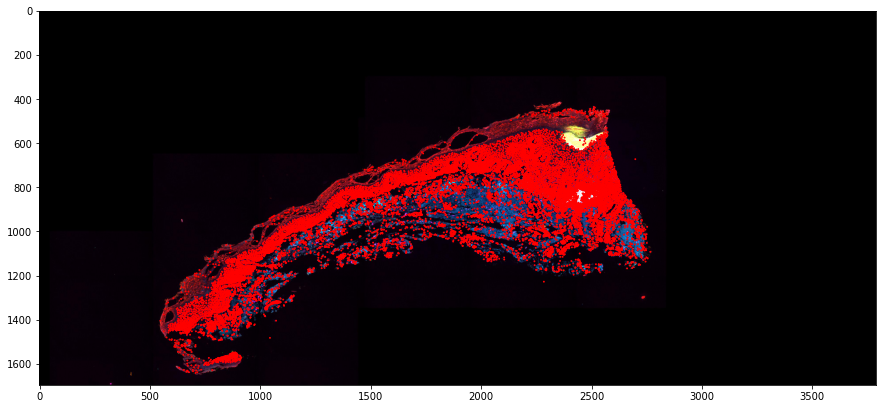

In [41]:
plt.figure(figsize = (15,15))
plt.gca().invert_yaxis()
plt.imshow(strish_demo.ref_image)
strish_demo.plot_cell_spatial_scatter(spot_size=0.8)

In [10]:
# plt.figure(figsize = (15,15))
# plt.imshow(strish_demo.ref_image)
print(strish_demo.ref_image.shape)

(1695, 3791, 3)


In [42]:
strish_demo.scan_cell_locs_by_window(init_sub_w =0.25, init_sub_h = 0.5)

/var/folders/vg/5bs8jwp12m5fw8pn1np6jb6m0000gr/T/ipykernel_44504/219619593.py:492: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.contours = np.array(contours)


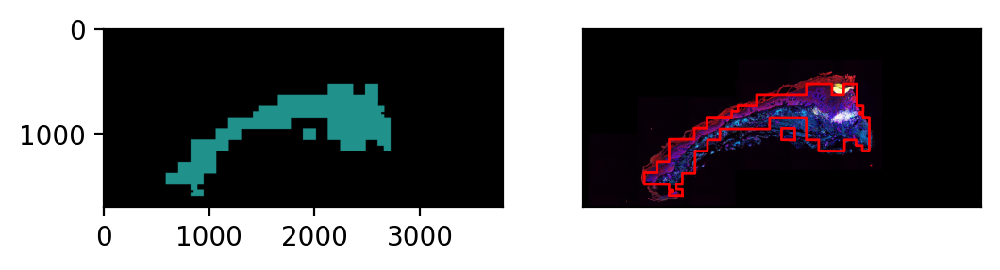

In [43]:
strish_demo.plot_tissue_window_contour(extend_margin=3, window_area_threshold=12390)

In [1902]:
# strish_demo

In [146]:
strish_demo.areas

array([49796,   754,  3068, 12390])

In [1904]:
# strish_demo.obs

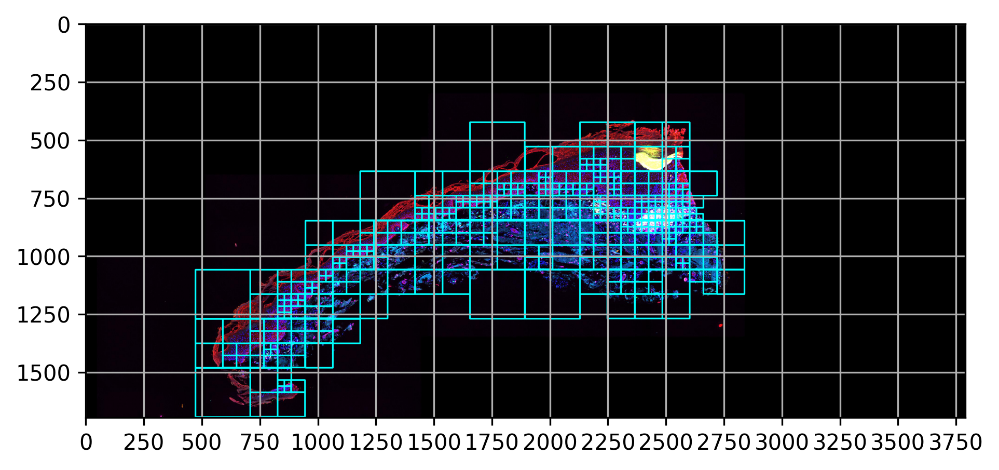

In [44]:
strish_demo.plot_scanned_windows(dpi=300, inteval=250)

In [72]:
marker_proteins = ['CD8', 'PD-L1', 'FoxP3', 'PD-1', 'PanCK', 'CD68']
filtered_strish_demo = strish_demo[:,marker_proteins]
filtered_strish_demo = filtered_strish_demo.preprocess_filter_size_shape(column= 'Nucleus: Area µm^2',
                                                                         lower=0.01,
                                                                         upper=0.95)


In [73]:
filtered_strish_demo.scan_cell_locs_by_window(init_sub_w =0.25, init_sub_h = 0.5)

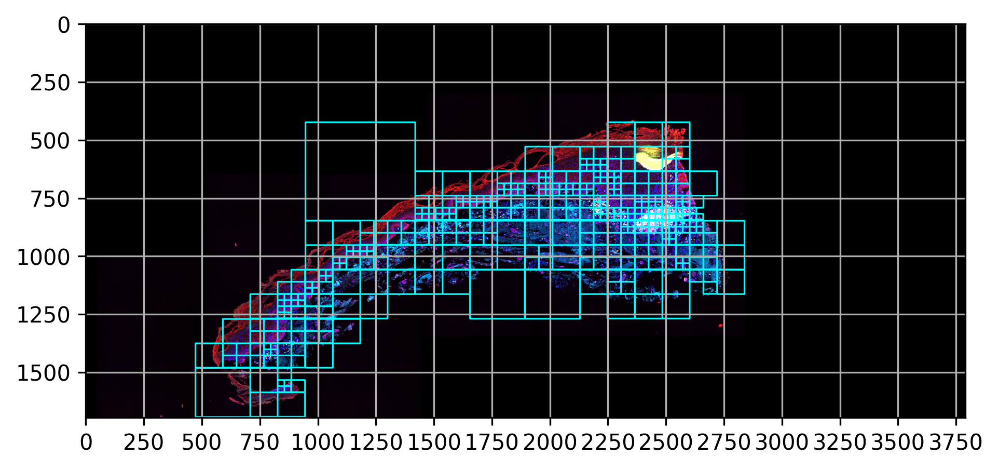

In [74]:
filtered_strish_demo.plot_scanned_windows(dpi=300, inteval=250)

/var/folders/vg/5bs8jwp12m5fw8pn1np6jb6m0000gr/T/ipykernel_44504/830846436.py:492: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.contours = np.array(contours)


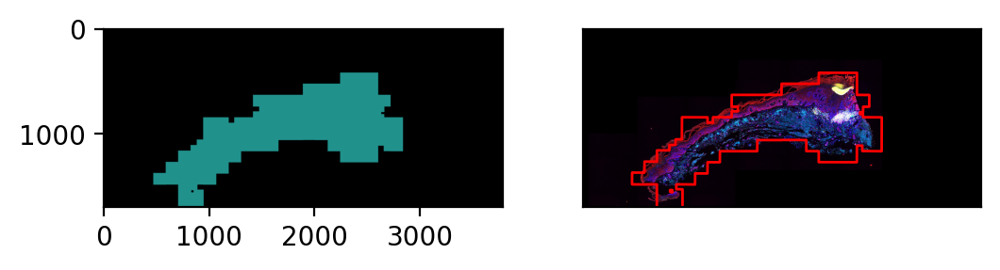

In [75]:
filtered_strish_demo.plot_tissue_window_contour(extend_margin=3, window_area_threshold=49796)

/var/folders/vg/5bs8jwp12m5fw8pn1np6jb6m0000gr/T/ipykernel_44504/830846436.py:492: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.contours = np.array(contours)


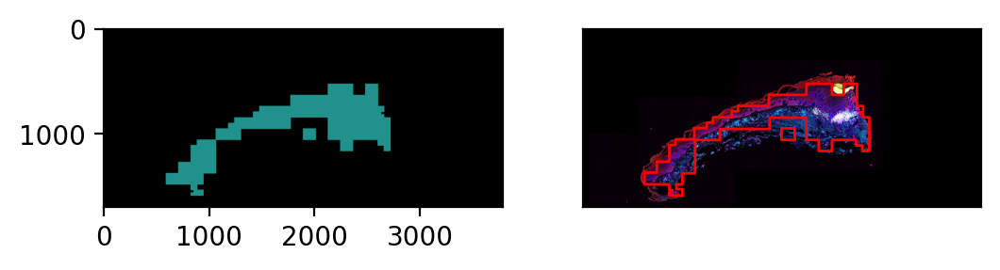

In [93]:
filtered_strish_demo.plot_tissue_window_contour(extend_margin=3, window_area_threshold=12390)

In [235]:
filtered_strish_demo.contours.shape

(2,)

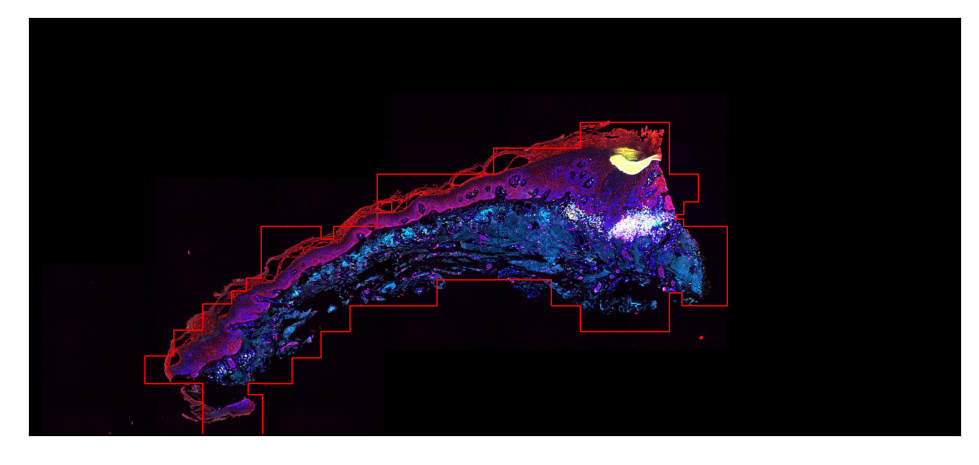

In [76]:
fig, ax = plt.subplots(dpi=200)
# ax.imshow(np.zeros_like(mask_by_dapi), cmap=plt.cm.gray)
ax.imshow(filtered_strish_demo.ref_image,cmap=plt.cm.gray)
# xs_coord = list()
# ys_coord = list()
for n, contour in enumerate(filtered_strish_demo.contours[0:1]):
    ax.plot(contour[:, 1], contour[:, 0], 'r',linewidth=0.5)
#     xs_coord.extend(contour[:, 1])
#     ys_coord.extend(contour[:, 0])
ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
fig.savefig("1021_tissue_contour.pdf")
plt.show()

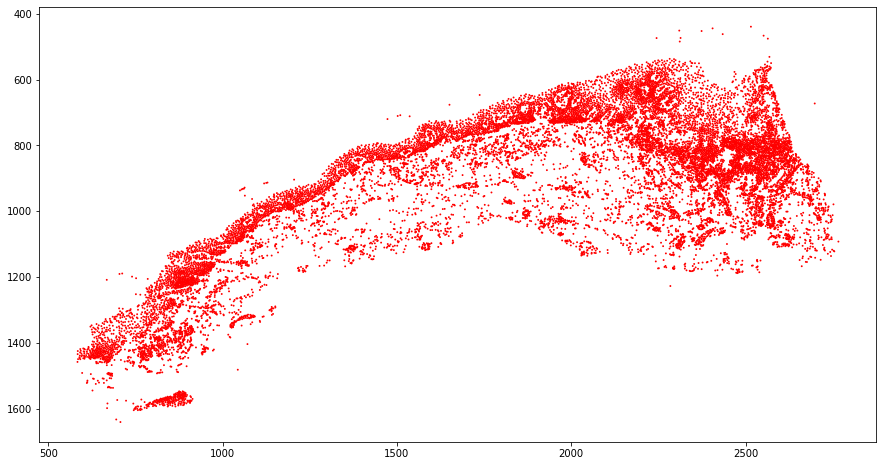

In [77]:
plt.figure(figsize = (15,8))
plt.gca().invert_yaxis()
# plt.imshow(strish_demo.ref_image)
filtered_strish_demo.plot_cell_spatial_scatter(spot_size=0.8)

In [149]:
# filtered_strish_demo

In [78]:
# strish_demo.obs
sc.pp.log1p(filtered_strish_demo)
# filtered_strish_demo.layers['scaled'] = sc.pp.scale(filtered_strish_demo, copy=True).X
sc.pp.scale(filtered_strish_demo)

In [79]:
sc.pp.neighbors(filtered_strish_demo, n_neighbors=15, n_pcs=6)
sc.tl.louvain(filtered_strish_demo, resolution=0.8)

/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Colocal_window' as categorical


<Figure size 1080x720 with 0 Axes>

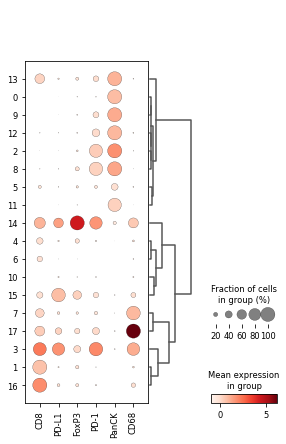

In [80]:
plt.figure(figsize = (15,10))
# rearrange the column to highligh
sc.pl.dotplot(filtered_strish_demo, marker_proteins, groupby='louvain', dendrogram=True)

In [81]:
filtered_strish_demo.layers['scaled'] = sc.pp.scale(filtered_strish_demo, copy=True).X


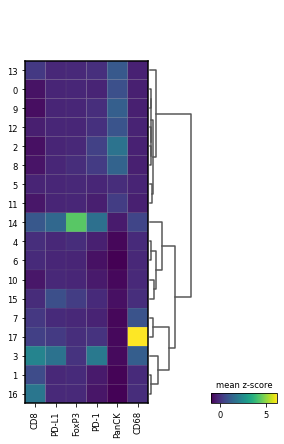

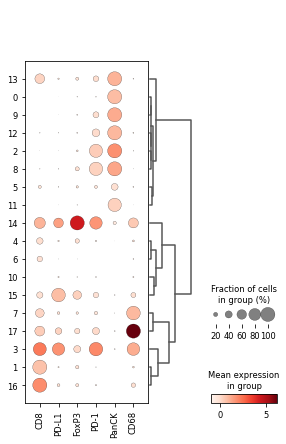

In [82]:
sc.pl.matrixplot(filtered_strish_demo, marker_proteins, 'louvain', dendrogram=True,
                 colorbar_title='mean z-score')
sc.pl.dotplot(filtered_strish_demo, marker_proteins, groupby='louvain', dendrogram=True)


In [289]:
# list(filtered_strish_demo.var_na mes)

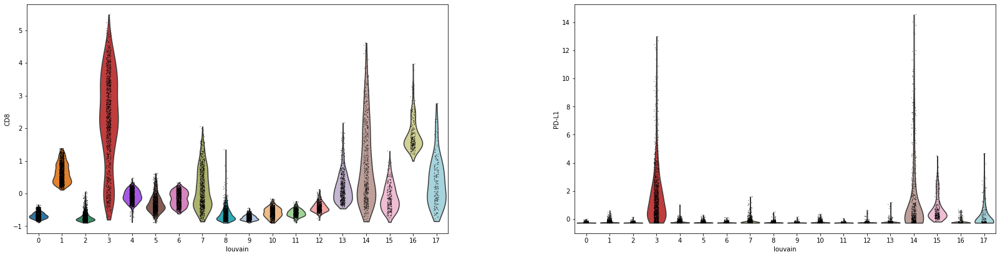

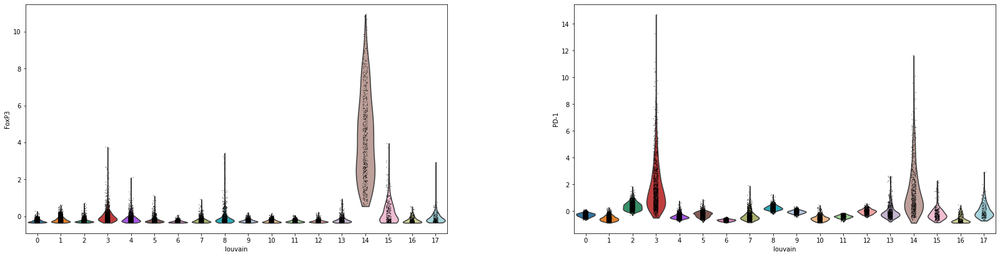

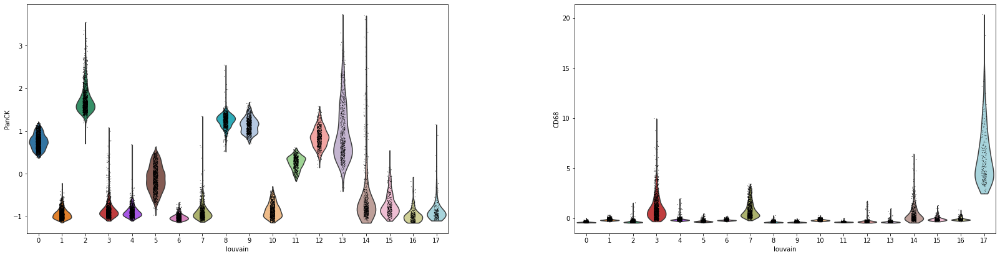

In [83]:
looper = iter(marker_proteins)
for marker1, marker2 in zip(looper, looper): 
#     print(marker1, marker2)
    with rc_context({'figure.figsize': (10, 7)}):
        sc.pl.violin(filtered_strish_demo, [marker1, marker2], groupby='louvain' ,ncols=2)

In [158]:
# filtered_strish_demo.obs['louvain'].unique()

In [84]:
cluster2colocalisation = {
    '0' : 'PanCK+',
    '17' : 'CD68+,PD1+',
    '7' : 'CD68+',
    '8' : 'PanCK+', 
    '9' : 'PanCK+', 
    '10' : 'Unidentified',
    '14' : 'CD8+,PD1+,FoxP3+', 
    '2' : 'PanCK+', 
    '4' : 'Unidentified', 
    '15' : 'PanCK+,PD-L1+', 
    '12' : 'PanCK+',
    '1' : 'CD8 T-cell', 
    '3' : 'CD8+,PD1+,FoxP3+',
    '11' : 'PanCK+',
    '16' : 'CD8 T-cell',
    '6' : 'Unidentified',
    '5' : 'Unidentified',
    '13' : 'PanCK+'
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
filtered_strish_demo.obs['cell_type'] = filtered_strish_demo.obs['louvain'].map(cluster2colocalisation).astype('category')


In [85]:
plot_target = 'cell_type'
ax_color_mapper = sns.color_palette("Set1",  len(set(filtered_strish_demo.obs[plot_target].values)))
color_mapper = dict()
for index, color in enumerate(ax_color_mapper):
#     print(color)
    color_mapper[list(set(filtered_strish_demo.obs[plot_target].values))[index]] = color
color_mapper

{'PanCK+,PD-L1+': (0.8941176470588236,
  0.10196078431372549,
  0.10980392156862745),
 'CD68+': (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 'PanCK+': (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 'CD68+,PD1+': (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 'Unidentified': (1.0, 0.4980392156862745, 0.0),
 'CD8 T-cell': (1.0, 1.0, 0.2),
 'CD8+,PD1+,FoxP3+': (0.6509803921568628,
  0.33725490196078434,
  0.1568627450980392)}

In [86]:
ax_color_mapper

[(0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
 (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 (1.0, 0.4980392156862745, 0.0),
 (1.0, 1.0, 0.2),
 (0.6509803921568628, 0.33725490196078434, 0.1568627450980392)]

In [87]:
uniform_color_mapper = {'CD68+,PD1+': (0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
                        'CD68+': (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
                        'CD8+,PD1+,FoxP3+': (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
                        'CD8+,FoxP3+': (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
                        'PanCK+': (1.0, 0.4980392156862745, 0.0),
                        'CD8 T-cell': (1.0, 1.0, 0.2),
                        'PanCK+,PD-L1+': (0.6509803921568628, 0.33725490196078434, 0.1568627450980392),
                       'CD8+,PD1+': (0.9686274509803922, 0.5058823529411764, 0.7490196078431373)}

In [1836]:
# filtered_strish_demo.obs

In [1919]:
# count_cell = filtered_strish_demo.obs.groupby('cell_type').agg(['count'])
# count_cell

,Centroid X µm,Centroid Y µm,Nucleus: Area µm^2,Nucleus: Length µm,Nucleus: Circularity,Nucleus: Solidity,Nucleus: Max diameter µm,Nucleus: Min diameter µm,X_px,Y_px,Colocal_window,louvain
,count,count,count,count,count,count,count,count,count,count,count,count
cell_type,,,,,,,,,,,,
CD68+,964,964,964,964,964,964,964,964,964,964,941,964
"CD68+,PD1+",196,196,196,196,196,196,196,196,196,196,192,196
CD8 T-cell,1827,1827,1827,1827,1827,1827,1827,1827,1827,1827,1781,1827
"CD8+,PD1+,FoxP3+",1813,1813,1813,1813,1813,1813,1813,1813,1813,1813,1749,1813
PanCK+,6871,6871,6871,6871,6870,6871,6871,6871,6871,6871,6693,6871
"PanCK+,PD-L1+",301,301,301,301,301,301,301,301,301,301,296,301
Unidentified,4093,4093,4093,4093,4093,4093,4093,4093,4093,4093,3989,4093


In [1570]:
print(16065 - 4093)
# filtered_strish_demo.obs

11972


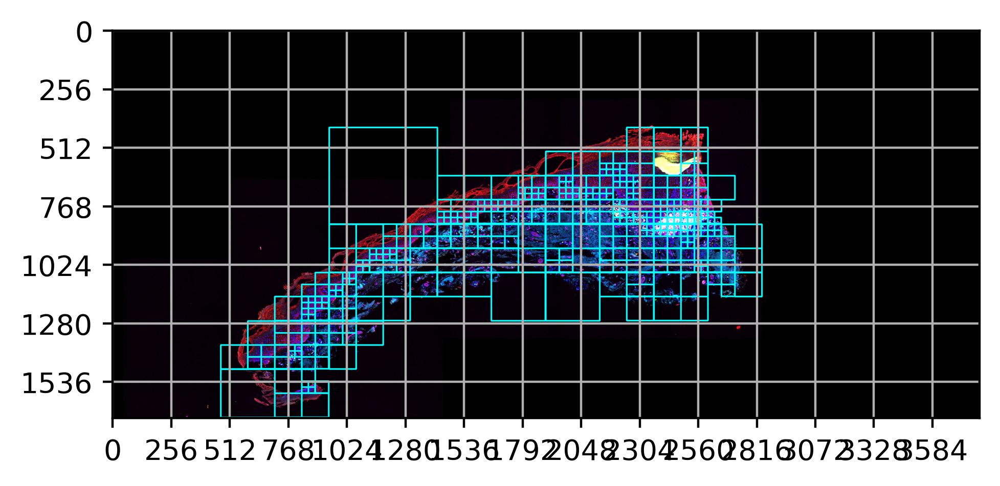

In [88]:
# filtered_strish_demo.layers['scaled'].shape
filtered_strish_demo.plot_scanned_windows()

In [89]:
filtered_strish_demo.areas

array([ 49796,  12390, 200079,    754,   3068])

In [90]:
filtered_strish_demo

STRISH object with n_obs × n_vars = 16065 × 6
 obs: 'Centroid X µm', 'Centroid Y µm', 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm', 'Nucleus: Min diameter µm', 'X_px', 'Y_px', 'Colocal_window', 'louvain', 'cell_type'
 var: 'mean', 'std'
 all_rects: (393, 4)
 areas: (5,)
 contours: (2,)
 ref_image: (1695, 3791, 3)
 original_coord_unit: µm
 ref_image_unit: px

In [97]:
filtered_strish_demo.scan_cell_colocalised_dectection(origin_cell_type=['CD68+,PD1+'], 
                                                      target_cell_type=['PanCK+,PD-L1+'], 
                                                      window_area_threshold = 3068)

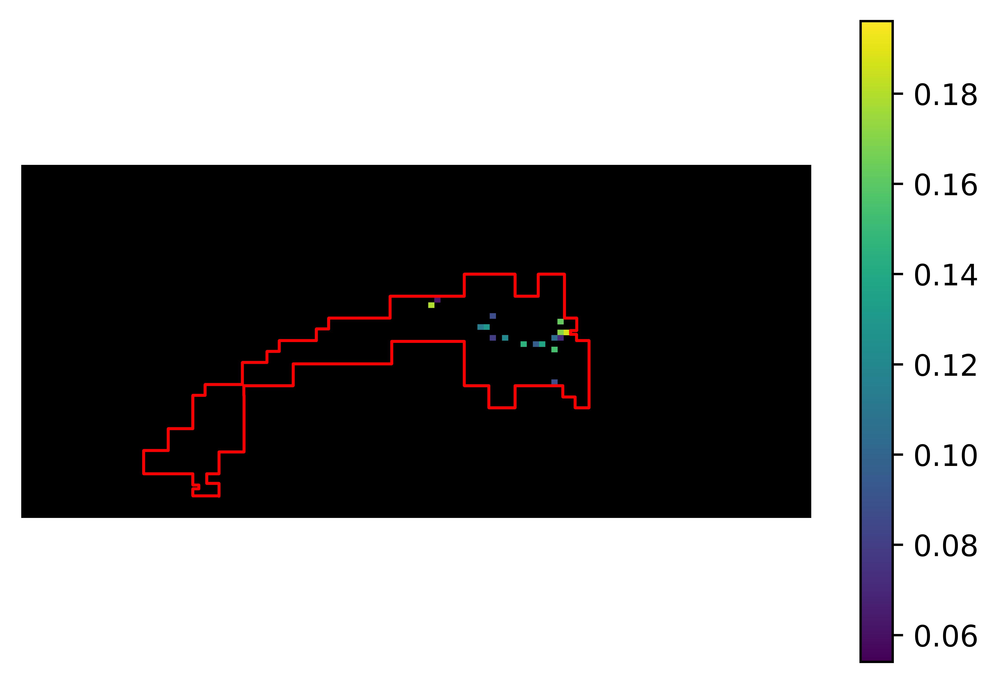

In [98]:
# filtered_strish_demo
filtered_strish_demo.plot_colocalized_heatmap(show_contour=True, n_contours=1,
                                              save_fn='1025_P04_cell_collocalised_heatmap_3.pdf')

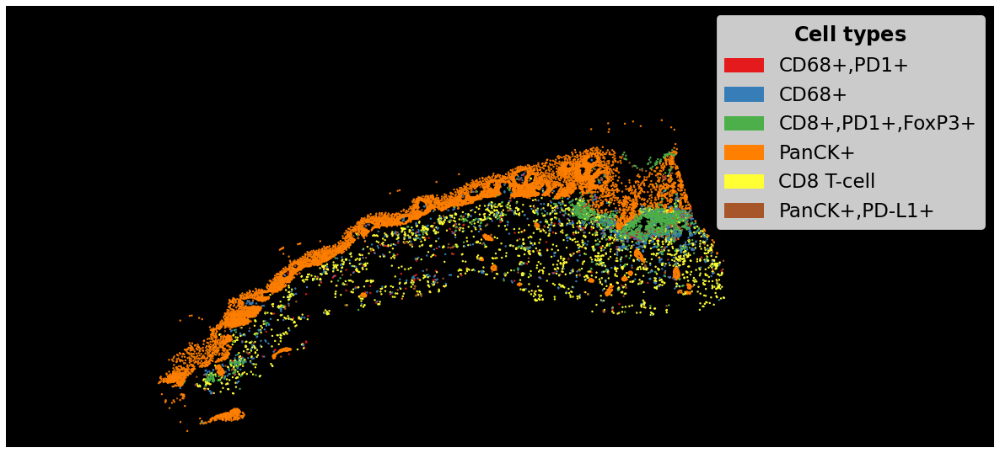

In [35]:
plt.figure(figsize = (21,12))
plt.imshow(np.zeros_like(filtered_strish_demo.ref_image))
# plt.gca().invert_yaxis()
plt.axis('off')
panck_cancer.plot_cell_spatial_scatter(spot_size=2,label= 'cell_type', color_mapper=uniform_color_mapper, 
                                       legend_log=1, save_fn='1012_P04_cell_type_visualisation.png')


### R01 Tissue 1 analysis

In [99]:
# filtered_strish_demo
# ref_img_data  = tifffile.imread(Path('/Volumes/BiomedML/Projects/SkinSpatial/B18_tile_3.ome.tif'))
input_path1 = Path('/Volumes/BiomedML/Projects/QuPath_projects/STRISH_polaris/R01/')
detection_report_fn = 'R01_skin1_measurement.txt'
ref_image_fn = 'R01_tile_1_RGB_ref.jpg'

In [100]:
strish_demo = Read_Polaris(input_path1.joinpath(detection_report_fn), input_path1.joinpath(ref_image_fn )) 

/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [101]:
strish_demo

STRISH object with n_obs × n_vars = 24392 × 8
 obs: 'Centroid X µm', 'Centroid Y µm', 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm', 'Nucleus: Min diameter µm'
 ref_image: (2411, 4328, 3)
 original_coord_unit: µm
 ref_image_unit: px

In [102]:
# R01
# strish_demo.convert_unit_micron2pixel(original_width_micron=, original_height_micron=4785.73)
# P04
strish_demo.convert_unit_micron2pixel(original_width_micron=8590.39, 
                                      original_height_micron=4785.73)

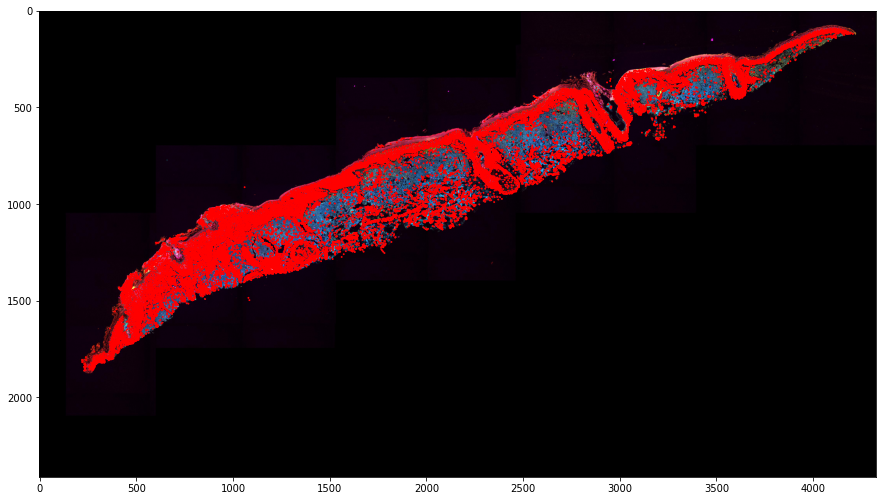

In [103]:
plt.figure(figsize = (15,15))
plt.gca().invert_yaxis()
plt.imshow(strish_demo.ref_image)
strish_demo.plot_cell_spatial_scatter(spot_size=0.8)

In [104]:
strish_demo.scan_cell_locs_by_window(init_sub_w =0.25, init_sub_h = 0.5)

In [106]:
print(strish_demo.ref_image.shape)
strish_demo.areas

(2411, 4328, 3)


array([  5025,   1221, 325682,  81270,  20250])

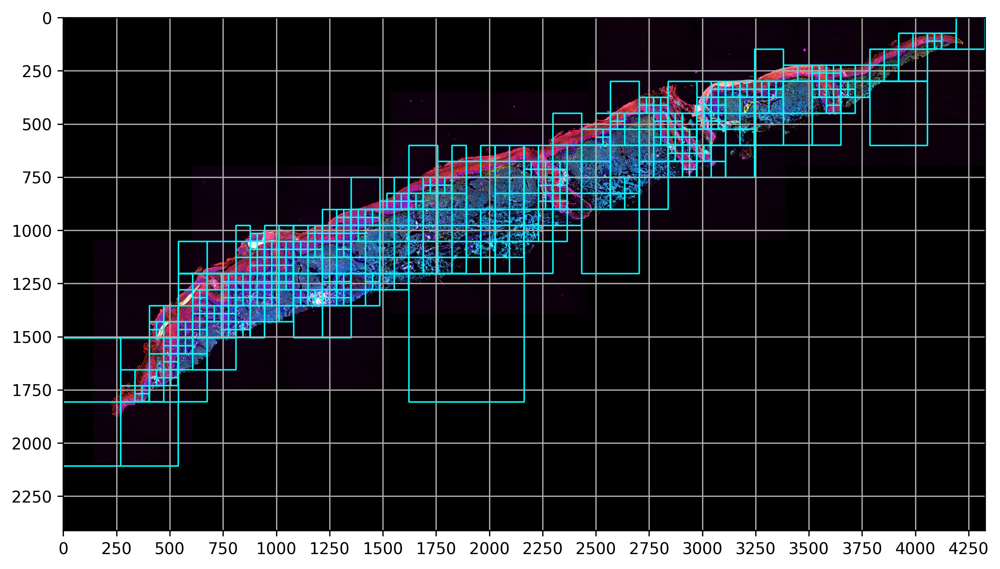

In [107]:
strish_demo.plot_scanned_windows(dpi=300, inteval=250)

/var/folders/vg/5bs8jwp12m5fw8pn1np6jb6m0000gr/T/ipykernel_44504/830846436.py:492: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.contours = np.array(contours)


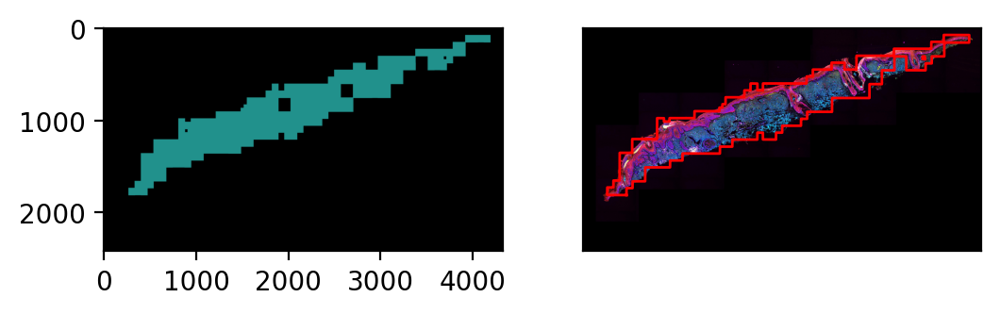

In [109]:
strish_demo.plot_tissue_window_contour(extend_margin=3, window_area_threshold=20250)

In [110]:
marker_proteins = ['CD8', 'PD-L1', 'FoxP3', 'PD-1', 'PanCK', 'CD68']
filtered_strish_demo = strish_demo[:,marker_proteins]
filtered_strish_demo = filtered_strish_demo.preprocess_filter_size_shape(column= 'Nucleus: Area µm^2',
                                                                         lower=0.01,
                                                                         upper=0.95)

/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [111]:
filtered_strish_demo.scan_cell_locs_by_window(init_sub_w =0.25, init_sub_h = 0.5)

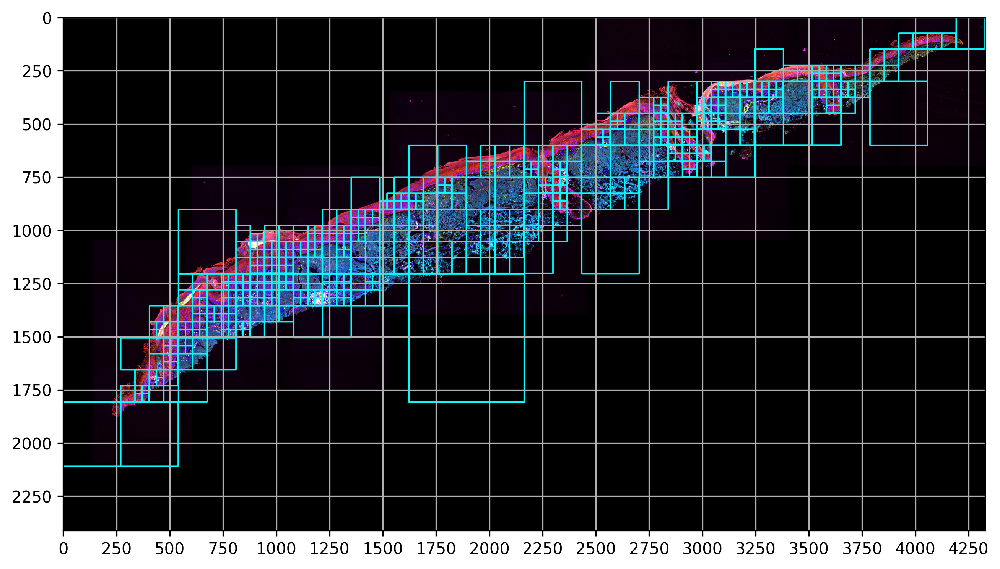

In [112]:
filtered_strish_demo.plot_scanned_windows(dpi=300, inteval=250)

In [113]:
filtered_strish_demo.areas

array([  5025,   1221, 325682,  81270,  20250])

/var/folders/vg/5bs8jwp12m5fw8pn1np6jb6m0000gr/T/ipykernel_44504/830846436.py:492: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.contours = np.array(contours)


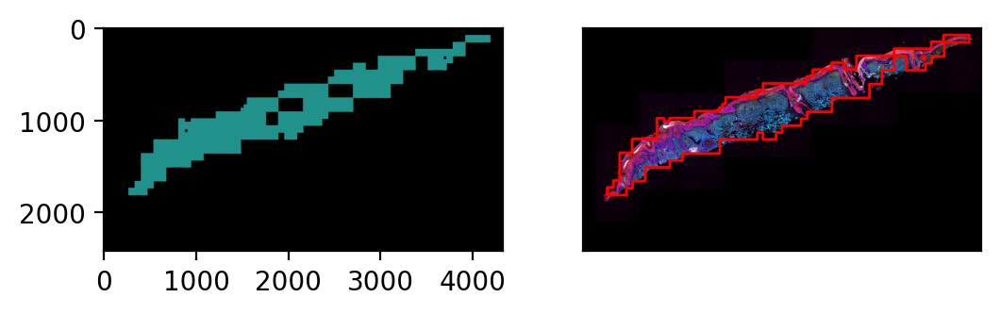

In [114]:
filtered_strish_demo.plot_tissue_window_contour(extend_margin=3, window_area_threshold=20250)

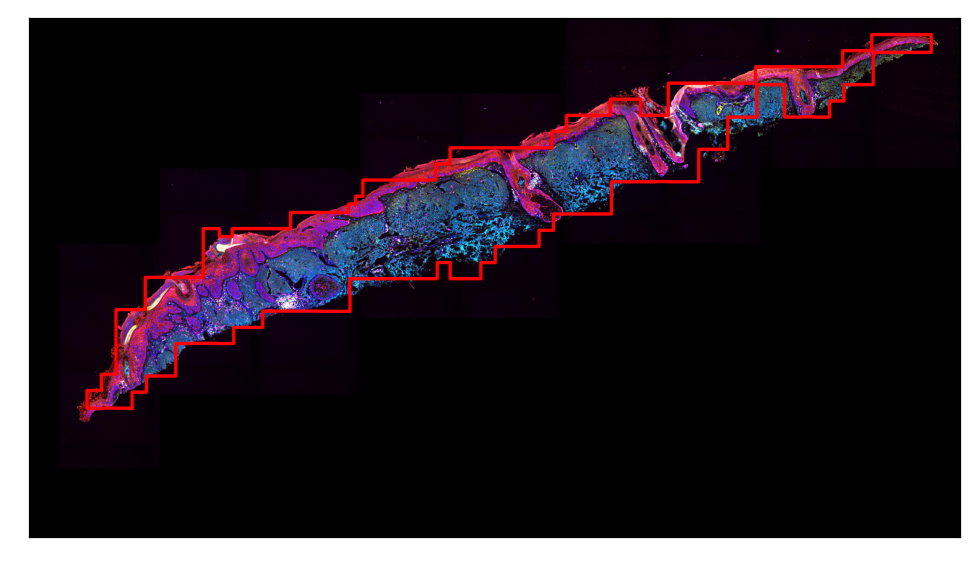

In [117]:
fig, ax = plt.subplots(dpi=200)
# ax.imshow(np.zeros_like(mask_by_dapi), cmap=plt.cm.gray)
ax.imshow(filtered_strish_demo.ref_image,cmap=plt.cm.gray)
# xs_coord = list()
# ys_coord = list()
for n, contour in enumerate(filtered_strish_demo.contours[0:1]):
    ax.plot(contour[:, 1], contour[:, 0], 'r',linewidth=1.2,rasterized=True)
#     xs_coord.extend(contour[:, 1])
#     ys_coord.extend(contour[:, 0])
ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
fig.savefig("1021_R01_T1_tissue_contour.pdf")
plt.show()

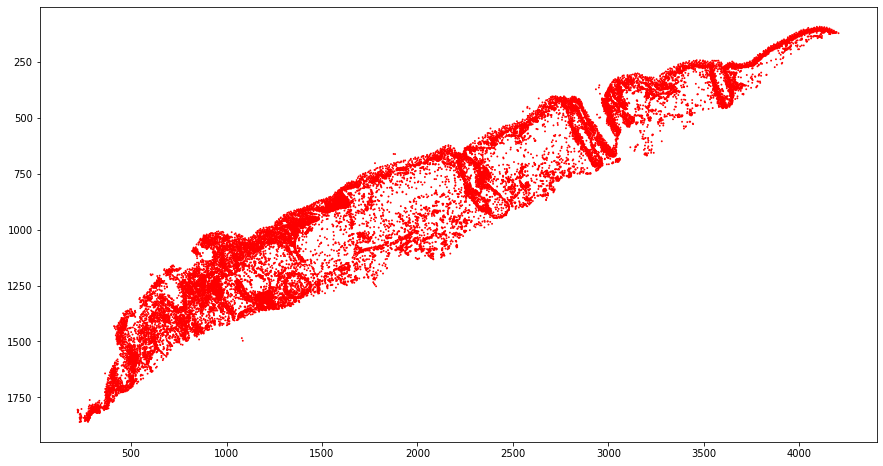

In [118]:
plt.figure(figsize = (15,8))
plt.gca().invert_yaxis()
# plt.imshow(strish_demo.ref_image)
filtered_strish_demo.plot_cell_spatial_scatter(spot_size=0.8)

In [119]:
filtered_strish_demo.to_df()

,CD8,PD-L1,FoxP3,PD-1,PanCK,CD68
0,0.3200,0.0075,0.1149,0.1523,2.0697,0.0589
1,0.2646,0.0243,0.1452,0.1847,1.8615,0.0575
2,0.2343,0.0302,0.1621,0.1549,1.9088,0.0518
3,0.2941,0.0013,0.1136,0.1196,1.7426,0.0436
4,0.1869,0.0042,0.1401,0.1077,2.3349,0.0571
...,...,...,...,...,...,...
24387,0.0984,0.0000,0.0120,0.1292,2.9316,0.0360
24388,0.3130,0.0000,0.0106,0.1321,3.3854,0.0237
24389,0.1035,0.0000,0.0291,0.1324,2.5736,0.0211
24390,0.5638,0.0000,0.0210,0.1594,3.5671,0.0261


In [120]:
# strish_demo.obs
sc.pp.log1p(filtered_strish_demo)
# filtered_strish_demo.layers['scaled'] = sc.pp.scale(filtered_strish_demo, copy=True).X
sc.pp.scale(filtered_strish_demo)

In [121]:
sc.pp.neighbors(filtered_strish_demo, n_neighbors=15, n_pcs=6)
sc.tl.louvain(filtered_strish_demo, resolution=0.8)

/Users/uqmtra12/miniconda3/envs/ultimate_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Colocal_window' as categorical


<Figure size 1080x720 with 0 Axes>

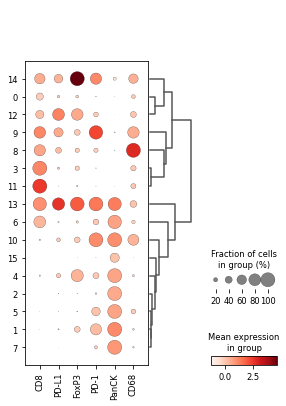

In [122]:
plt.figure(figsize = (15,10))
# rearrange the column to highligh
sc.pl.dotplot(filtered_strish_demo, marker_proteins, groupby='louvain', dendrogram=True)

In [123]:
filtered_strish_demo.layers['scaled'] = sc.pp.scale(filtered_strish_demo, copy=True).X


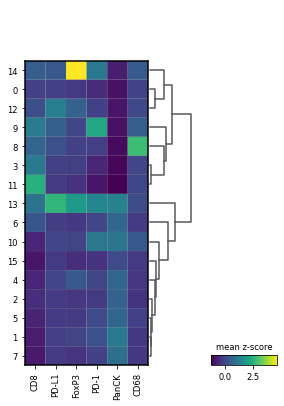

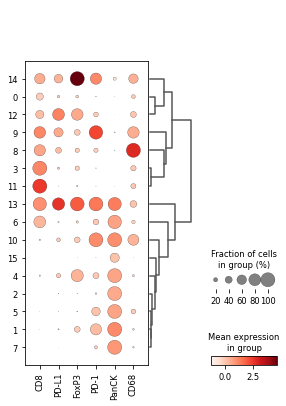

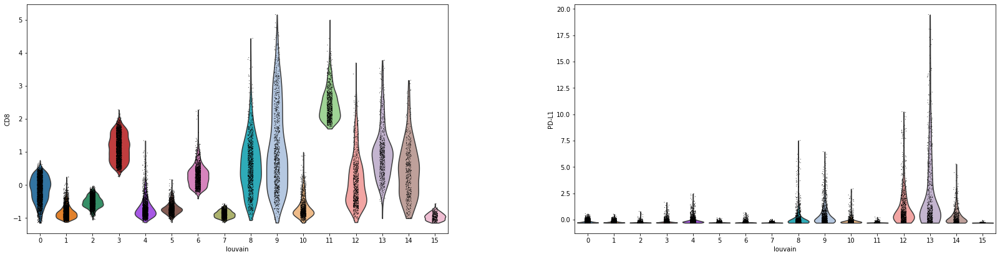

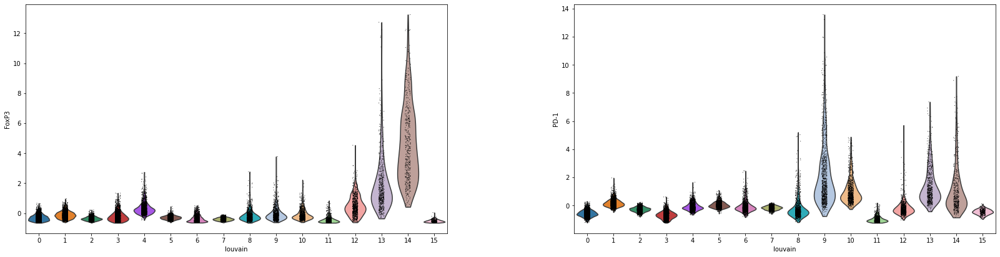

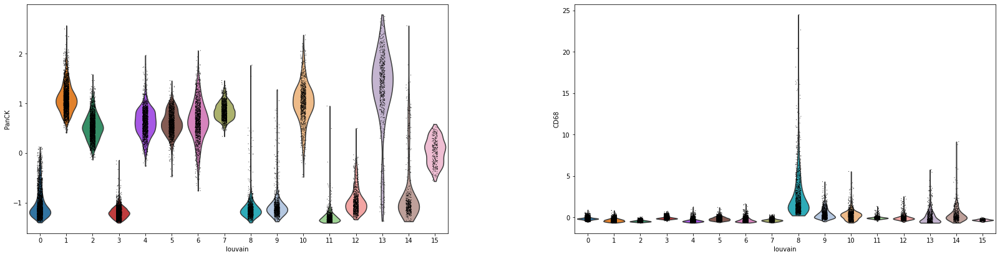

In [124]:
sc.pl.matrixplot(filtered_strish_demo, marker_proteins, 'louvain', dendrogram=True,
                 colorbar_title='mean z-score')
sc.pl.dotplot(filtered_strish_demo, marker_proteins, groupby='louvain', dendrogram=True)
looper = iter(marker_proteins)
for marker1, marker2 in zip(looper, looper): 
#     print(marker1, marker2)
    with rc_context({'figure.figsize': (10, 7)}):
        sc.pl.violin(filtered_strish_demo, [marker1, marker2], groupby='louvain' ,ncols=2)

In [125]:
cluster2colocalisation = {
    '0' : 'Unidentified',
    '7' : 'PanCK+',
    '8' : 'CD68+', 
    '9' : 'CD68+,PD1+', 
    '10' : 'PanCK+',
    '14' : 'CD8+,PD1+,FoxP3+', 
    '2' : 'PanCK+', 
    '4' : 'PanCK+', 
    '15' : 'Unidentified', 
    '12' : 'Unidentified',
    '1' : 'PanCK+', 
    '3' : 'CD8 T-cell',
    '11' : 'CD8 T-cell',
    '6' : 'PanCK+',
    '5' : 'PanCK+',
    '13' : 'PanCK+,PD-L1+'
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
filtered_strish_demo.obs['cell_type'] = filtered_strish_demo.obs['louvain'].map(cluster2colocalisation).astype('category')


In [128]:
# filtered_strish_demo
panck =filtered_strish_demo[filtered_strish_demo.obs['cell_type'] != 'Unidentified']
panck

STRISH object with n_obs × n_vars = 18939 × 6
 obs: 'Centroid X µm', 'Centroid Y µm', 'Nucleus: Area µm^2', 'Nucleus: Length µm', 'Nucleus: Circularity', 'Nucleus: Solidity', 'Nucleus: Max diameter µm', 'Nucleus: Min diameter µm', 'X_px', 'Y_px', 'Colocal_window', 'louvain', 'cell_type'
 ref_image: (2411, 4328, 3)
 original_coord_unit: µm
 ref_image_unit: px

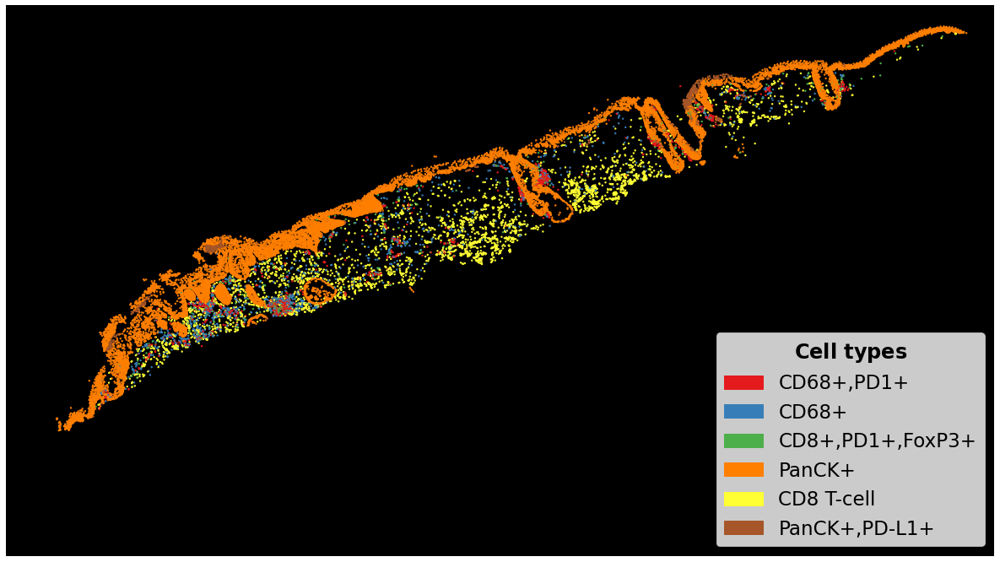

In [132]:
plt.figure(figsize = (21,12))
plt.imshow(np.zeros_like(panck.ref_image))
# plt.gca().invert_yaxis()
plt.axis('off')
panck.plot_cell_spatial_scatter(spot_size=2,label= 'cell_type', color_mapper=uniform_color_mapper, 
                                       legend_log=4, save_fn='1022_R01_T1_cell_type_visualisation.png')

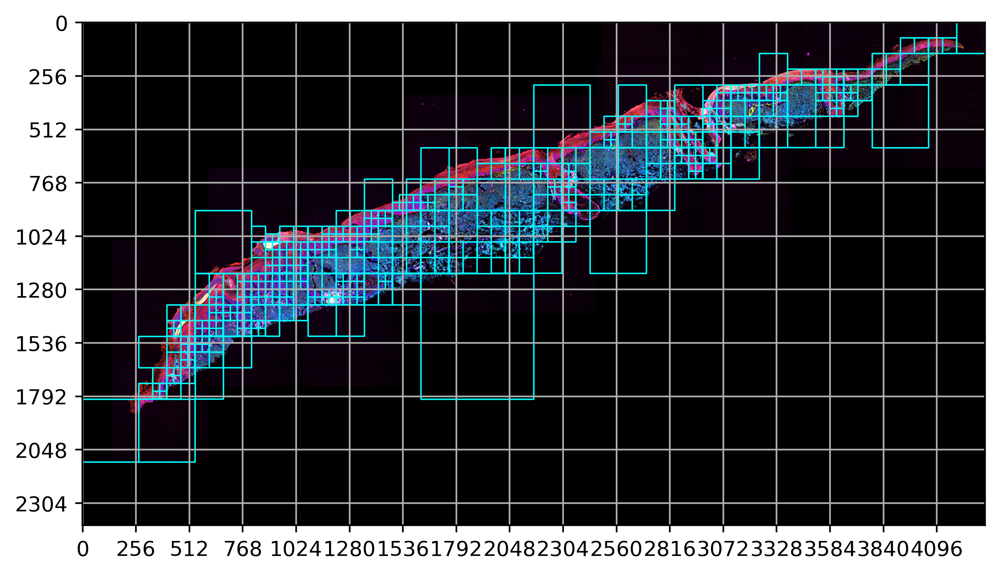

In [134]:
panck.plot_scanned_windows()

In [136]:
sorted(panck.areas)

[1221, 5025, 20250, 81270, 325682]

/var/folders/vg/5bs8jwp12m5fw8pn1np6jb6m0000gr/T/ipykernel_44504/830846436.py:492: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self.contours = np.array(contours)


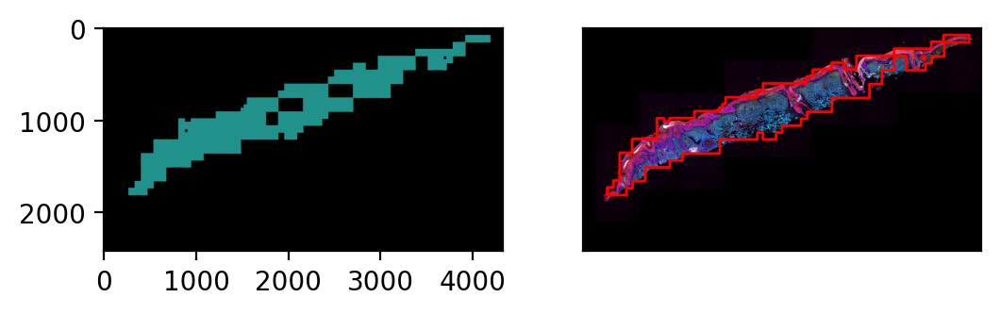

In [137]:
panck.plot_tissue_window_contour(extend_margin=3, window_area_threshold=20250)

In [139]:
panck.scan_cell_colocalised_dectection(origin_cell_type=['CD68+,PD1+'], 
                                                      target_cell_type=['PanCK+,PD-L1+'], 
                                                      window_area_threshold = 20250)

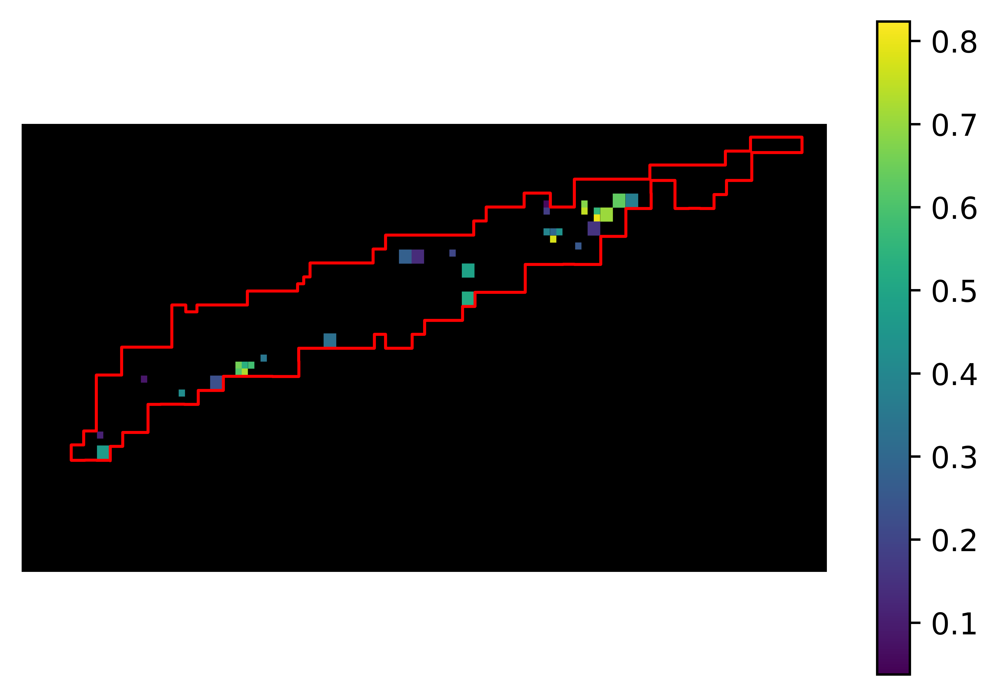

In [140]:
# filtered_strish_demo
panck.plot_colocalized_heatmap(show_contour=True, n_contours=1,
                                              save_fn='1022_R01_T1_cell_collocalised_heatmap_3.pdf')